In [1]:
!nvidia-smi

Tue Jun 22 19:02:18 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 465.27       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   48C    P8    10W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

# Wasserstein GAN в задаче идентификации аномалий в геофизических данных
### Исходные данные

<center><img src="img/source_data_example.png" width=600></center>

### Создание датасета

In [2]:
import torch
import torchvision
import numpy as np
import matplotlib.pyplot as plt
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, TensorDataset, DataLoader
from torch.autograd import Variable
from tqdm import tqdm
#from libs.service_defs import *
import torch.autograd as autograd
from scipy import stats
from torch.utils.tensorboard import SummaryWriter
import zipfile
import os

from typing import Tuple, List, Type, Dict, Any

In [3]:
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
DEVICE

device(type='cuda')

In [4]:
# Проверим доступность GPU
Tensor = torch.cuda.FloatTensor if torch.cuda.is_available() else torch.FloatTensor
torch.cuda.device_count()

1

In [5]:
#from google.colab import drive
#drive.mount('/content/drive')

In [6]:
#!unzip /content/drive/MyDrive/HW7/data.zip

In [7]:
class DS(Dataset):
    def __init__(self,
                 pv_fname: str = '',
                 gh_fname: str = '',
                 mask_fname: str = '',
                 transform: Any = None):

        self.pv = np.load(pv_fname, mmap_mode='r')
        self.gh = np.load(gh_fname, mmap_mode='r')
        self.mask = np.load(mask_fname)
        self.tensor_mask = torch.tensor(self.mask)
        self.transform = transform
        

    def __getitem__(self, index):
        x = np.zeros((1,2,256,256))
        
        pv_img = np.copy(self.pv[index])
        gh_img = np.copy(self.gh[index])
        pv_img *= self.mask
        gh_img *= self.mask
        
        
        if self.transform is not None:
            pv_img = self.transform(pv_img)
            gh_img = self.transform(gh_img)
        
        x = torch.cat((pv_img, gh_img), 0)
        x = x.unsqueeze(0)

        return x
    

    def __len__(self):
        length = len(self.pv)
        return length

In [8]:
mask_fname = '/content/mask_256.npy'
mask = torch.tensor(np.load(mask_fname), device=DEVICE)
def apply_mask(batch) :
    x = torch.empty_like(batch).copy_(batch)
    batch_size = batch.shape[0]
    for sample_id in range(batch_size) :
        x[sample_id][0] *= mask
        x[sample_id][1] *= mask
    return x

In [9]:
train_transforms = torchvision.transforms.Compose([
                        torchvision.transforms.ToTensor(),
                        torchvision.transforms.RandomRotation(45),
                        torchvision.transforms.RandomErasing(p=0.1, scale=(0.005,0.01)),
                        torchvision.transforms.GaussianBlur(kernel_size=3, sigma=(0.1, 0.6))
                        ])

In [10]:
train_dataset = DS('/content/pv_data_projected_all.normed01.npy',
                   '/content/gh_data_projected_all.normed01.npy',
                   '/content/mask_256.npy',
                   train_transforms)

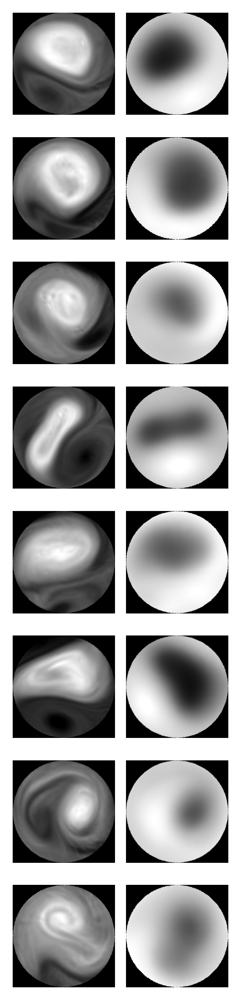

In [11]:
indices = np.random.randint(0, len(train_dataset), size=8)
samples = [train_dataset[idx] for idx in indices]
fig = plt.figure(figsize=(2, 8), dpi=300)
for idx,sample in enumerate(samples):
    sample_np = sample.squeeze(0).numpy()
    p = plt.subplot(8,2,idx*2+1)
    plt.imshow(sample_np[0], cmap='gray')
    plt.axis('off')
    
    p = plt.subplot(8,2,idx*2+2)
    plt.imshow(sample_np[1], cmap='gray')
    plt.axis('off')
    
plt.tight_layout()
fig.patch.set_facecolor('white')

### Модель WGAN

In [12]:
class Generator(nn.Module):
    
    def __init__(self, n_inputs=128):
        super(Generator, self).__init__()
        
        self.input_size = n_inputs
        self.DNN_channels = 512
        self.DNN_width = 8
        linear_output_dim = self.DNN_channels * self.DNN_width * self.DNN_width
        self.input_NN = nn.ModuleList([
            nn.Linear(self.input_size, 1024),
            nn.BatchNorm1d(num_features=1024),
            nn.LeakyReLU(),
            nn.Linear(1024, 8192),
            nn.BatchNorm1d(num_features=8192),
            nn.LeakyReLU(),
            nn.Linear(8192, linear_output_dim),
            nn.BatchNorm1d(num_features=linear_output_dim),
            nn.LeakyReLU()
        ])
        self.DNN = nn.ModuleList([
            nn.Upsample(scale_factor=(2,2), mode='bilinear'),
            nn.ConvTranspose2d(in_channels=self.DNN_channels, out_channels=256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=256),
            nn.LeakyReLU(),
            nn.Upsample(scale_factor=(2,2), mode='bilinear'),
            nn.ConvTranspose2d(in_channels=256, out_channels=128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=128),
            nn.LeakyReLU(),
            nn.Upsample(scale_factor=(2,2), mode='bilinear'),
            nn.ConvTranspose2d(in_channels=128, out_channels=32, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=32),
            nn.LeakyReLU(),
            nn.Upsample(scale_factor=(2,2), mode='bilinear'),
            nn.ConvTranspose2d(in_channels=32, out_channels=8, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=8),
            nn.LeakyReLU(),
            nn.Upsample(scale_factor=(2,2), mode='bilinear'),
            nn.ConvTranspose2d(in_channels=8, out_channels=2, kernel_size=3, stride=1, padding=1),
            nn.Tanh()])

    def forward(self, x_noise):
        x = x_noise
        for _, f in enumerate(self.input_NN) :
            x = f(x)
        
        x = torch.reshape(x, (-1, self.DNN_channels, self.DNN_width, self.DNN_width))
        
        for _, f in enumerate(self.DNN) :
            x = f(x)
        return x

In [13]:
class Discriminator(nn.Module):
    
    def __init__(self):
        super(Discriminator, self).__init__()
        self.channels_num = 2
        self.CNN = nn.ModuleList([
            nn.Conv2d(in_channels=self.channels_num, out_channels=4, kernel_size=3, padding=1, stride=2, bias=False),
            nn.LeakyReLU(),
            nn.Conv2d(in_channels=4, out_channels=16, kernel_size=3, padding=1, stride=2, bias=False),
            nn.LeakyReLU(),
            nn.Conv2d(in_channels=16, out_channels=64, kernel_size=3, padding=1, stride=2, bias=False),
            nn.LeakyReLU(),
            nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, padding=1, stride=2, bias=False),
            nn.LeakyReLU(),
            nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, padding=1, stride=2, bias=False),
            nn.LeakyReLU()
        ])
        self.CNN_output_dim = 16384
        self.classifier = nn.ModuleList([
            nn.Linear(self.CNN_output_dim, 4096),
            nn.LeakyReLU(),
            nn.Linear(4096, 512),
            nn.LeakyReLU(),
            nn.Linear(512, 32),
            nn.LeakyReLU(),
            nn.Linear(32, 1),
        ])

    def forward(self, x):
        
        for _, f in enumerate(self.CNN) :
            x = f(x)
        
        x = torch.flatten(x, start_dim=1)
        
        for _, f in enumerate(self.classifier) :
            x = f(x)
        
        return x

In [14]:
latent_dim = 128

In [15]:
gen = Generator(n_inputs=latent_dim)
gen = gen.to(DEVICE)

In [16]:
dsc = Discriminator()
dsc = dsc.to(DEVICE)

In [17]:
# Также следует создать оптимизаторы отдельно для генератора и для дискриминатора
opt_gen = torch.optim.Adam(gen.parameters(), lr=1e-2)
opt_dsc = torch.optim.SGD(dsc.parameters(), lr=5e-3, momentum=0.9)

### Обучение модели

In [18]:
def compute_gradient_penalty(model_dsc, real_samples, fake_samples):
    alpha = Tensor(np.random.random((real_samples.size(0), 1, 1, 1)))
    interpolates = (alpha * real_samples + ((1 - alpha) * fake_samples)).requires_grad_(True)
    d_interpolates = model_dsc(interpolates)
    fake = Variable(Tensor(d_interpolates.shape[0], 1).fill_(1.0), requires_grad=False)
    gradients = autograd.grad(outputs=d_interpolates,
                              inputs=interpolates,
                              grad_outputs=fake,
                              create_graph=True,
                              retain_graph=True,
                              only_inputs=True)[0]
    gradients = gradients.view(gradients.size(0), -1)
    gradient_penalty = ((gradients.norm(2, dim=1) - 1) ** 2).mean()
    return gradient_penalty

In [19]:
def train_model(model_gen: torch.nn.Module, 
                model_dsc: torch.nn.Module, 
                train_dataset: torch.utils.data.Dataset,
                optimizer_gen: torch.optim.Optimizer,
                optimizer_dsc: torch.optim.Optimizer,
                batch_size = 32,
                max_epochs = 10,
                n_critic = 5,
                lambda_gp = 10):

    tb_writer = SummaryWriter(log_dir="./logs/run002/")
    train_loader = torch.utils.data.DataLoader(train_dataset, shuffle=True, batch_size=batch_size)
    
    lr_scheduler_gen = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer_gen)
    lr_scheduler_dsc = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer_dsc)
    #lr_schreduler_dsc = torch.optim.lr_scheduler.CyclicLR(optimizer_dsc, base_lr=1e-2, max_lr=5e-2)
        
    val_loss_history = []
    gen_loss_history = []
    dsc_loss_history = []
    loss_gen = None
    loss_dsc = None
    
    for epoch in range(max_epochs):
        print(f'Starting epoch {epoch+1} of {max_epochs}')
        
        model_gen.train()
        model_dsc.train()
        
        with tqdm(total=len(train_loader)) as pbar:
            for idx, real_batch in enumerate(train_loader):
                real_batch = real_batch.squeeze(dim=1)
                real_batch = real_batch.to(DEVICE)
                optimizer_dsc.zero_grad()
                noise = Variable(torch.tensor(np.random.normal(0, 1, (len(real_batch), latent_dim)), dtype=torch.float, device=DEVICE))
                fake_batch = gen(noise)
                fake_batch = apply_mask(fake_batch)
                fake_batch = fake_batch.to(DEVICE)

                real_scores = dsc(real_batch)
                fake_scores = dsc(fake_batch)
                gradient_penalty = compute_gradient_penalty(dsc, real_batch, fake_batch)
                
                loss_dsc = torch.mean(fake_scores) - torch.mean(real_scores) + lambda_gp * gradient_penalty
                loss_dsc.backward()
                optimizer_dsc.step()

                if idx % n_critic == 0:
                    
                    optimizer_gen.zero_grad()
                    fake_batch = gen(noise)
                    fake_batch = apply_mask(fake_batch)
                    fake_batch.to(DEVICE)
                    fake_scores = dsc(fake_batch)
                    
                    loss_gen = -torch.mean(fake_scores)

                    loss_gen.backward()
                    optimizer_gen.step()
                    tb_writer.add_scalar(f'loss_gen_epoch{epoch+1}', loss_gen, global_step=idx+1)

                if (idx % 75 == 0) and (idx != 0):
                    for tag, param in model_gen.named_parameters() :
                        tb_writer.add_histogram(f'grad_gen_epoch{epoch+1}/%s'%tag, param.grad.data.cpu().numpy(), idx+1)
                        tb_writer.add_histogram(f'weight_gen_epoch{epoch+1}/%s'%tag, param.data.cpu().numpy(), idx+1)
                    for tag, param in model_dsc.named_parameters() :
                        tb_writer.add_histogram(f'grad_dsc_epoch{epoch+1}/%s'%tag, param.grad.data.cpu().numpy(), idx+1)
                        tb_writer.add_histogram(f'weight_dsc_epoch{epoch+1}/%s'%tag, param.data.cpu().numpy(), idx+1)
                    #for i in range(len(outputs)) :
                        #tb_writer.add_histogram('activation_/%s'%i, outputs[i].detach().cpu().numpy(), epoch)
                if (idx % 150 == 0) and (idx != 0):
                    torch.save(model_gen, f'generator_{epoch}_{idx+1}.pth')
                    torch.save(model_dsc, f'discrimiantor_{epoch}_{idx+1}.pth')

                tb_writer.add_scalar(f'loss_dsc_epoch{epoch+1}', loss_dsc, global_step=idx+1)
                pbar.update(1)
                pbar.set_postfix({'step': idx+1, 'loss_GEN': loss_gen.item(), 'loss_DSC': loss_dsc.item()})
                
        torch.save(model_gen, f'generator_{epoch}.pth')
        torch.save(model_dsc, f'discriminator_{epoch}.pth')
        
        # Валидация - оценка функции потерь WGAN-GP (без регуляризационного члена) как D(x_real) - D(x_fake)
        
        model_gen.eval()
        model_dsc.eval()
        val_loss_epoch = torch.mean(fake_scores) - torch.mean(real_scores)
        
        val_loss_history.append(val_loss_epoch)
        
        lr_scheduler_gen.step()
        lr_scheduler_dsc.step()
        
    return val_loss_history, dsc_loss_history, gen_loss_history

In [20]:
%reload_ext tensorboard
%tensorboard --logdir logs/run001

Reusing TensorBoard on port 6006 (pid 427), started 0:49:15 ago. (Use '!kill 427' to kill it.)

<IPython.core.display.Javascript object>

In [21]:
torch.autograd.set_detect_anomaly(True)
loss_history, dsc_loss_history, gen_loss_history = train_model(gen, dsc,
                                                               train_dataset,
                                                               opt_gen, opt_dsc,
                                                               max_epochs=1,
                                                               n_critic=3,
                                                               lambda_gp=5)

  0%|          | 0/664 [00:00<?, ?it/s]

Starting epoch 1 of 1


/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3613: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)
 40%|███▉      | 263/664 [09:02<13:47,  2.06s/it, step=263, loss_GEN=3.84e+18, loss_DSC=1.06e+34]
ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py", line 2882, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-21-eb7adbbf9fd8>", line 7, in <module>
    lambda_gp=5)
  File "<ipython-input-19-07ba9035a5dd>", line 31, in train_model
    for idx, real_batch in enumerate(train_loader):
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 521, in __next__
    data = self._next_data()
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 561, in _next_data
    data = self._dataset_fetcher.fetch(index)  # may raise StopIteration
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/_utils/fetch.py", line 44, in fetch
    data = [self.dataset[idx] for idx in possibly_batched_index]
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/_utils/fetch.py", line 44, in <listcomp>
    data = [self.dataset[idx] f

KeyboardInterrupt: ignored

### Визуализация обучения

In [ ]:
f = plt.figure(figsize=(8,3), dpi=300)
p = plt.subplot(1,3,1)
_ = plt.scatter(np.arange(len(loss_history)), loss_history, s=1)

p = plt.subplot(1,3,2)
_ = plt.scatter(np.arange(len(dsc_loss_history)), dsc_loss_history, s=1)

p = plt.subplot(1,3,3)
_ = plt.scatter(np.arange(len(gen_loss_history)), gen_loss_history, s=1)

### Применение генератора

In [22]:
train_loader = torch.utils.data.DataLoader(train_dataset, shuffle=True, batch_size=32)

In [23]:
for idx, real_batch in enumerate(train_loader):
    break
real_batch = real_batch.squeeze_(dim=1)

In [ ]:
# При необходимости можно загрузить нужное состояние генератора
gen = Generator(n_inputs=latent_dim)
gen.load_state_dict(torch.load('./path/to/model/checkpoint/gen.pt'))
gen = gen.to(DEVICE)
gen.eval()

In [24]:
real_batch = real_batch.to(DEVICE)
noise = Variable(torch.tensor(np.random.normal(0, 1, (len(real_batch), latent_dim)),
                              dtype=torch.float, device=DEVICE))
fake_batch = gen(noise)
fake_batch = apply_mask(fake_batch)

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3613: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)


In [ ]:
dsc = Discriminator()
dsc.load_state_dict(torch.load('./path/to/model/checkpoint/dsc.pt'))
dsc = dsc.to(DEVICE)
dsc.eval()

In [25]:
real_result = dsc(real_batch)
fake_result = dsc(fake_batch)
print(f"Real accuracy: {sum(real_result)}")
print(f"Fake accuracy: {sum(fake_result)}")

Real accuracy: tensor([nan], device='cuda:0', grad_fn=<AddBackward0>)
Fake accuracy: tensor([nan], device='cuda:0', grad_fn=<AddBackward0>)


In [26]:
real_batch = real_batch.detach().cpu().numpy()
fake_batch = fake_batch.detach().cpu().numpy()

(-0.5, 255.5, 255.5, -0.5)

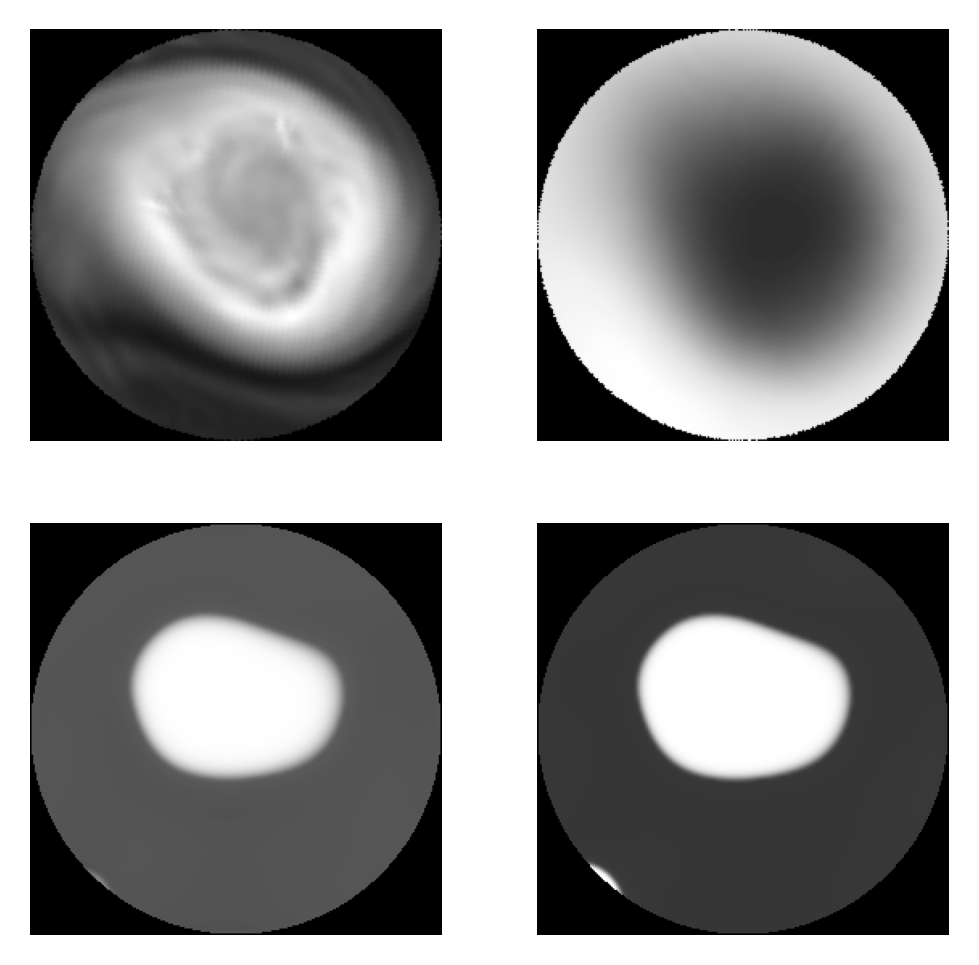

In [27]:
f = plt.figure(figsize=(4,4), dpi=300)
p = plt.subplot(2,2,1)
plt.imshow(real_batch[0,0,...], cmap='gray')
plt.axis('off')
p = plt.subplot(2,2,2)
plt.imshow(real_batch[0,1,...], cmap='gray')
plt.axis('off')

p = plt.subplot(2,2,3)
plt.imshow(fake_batch[2,0,...], cmap='gray')
plt.axis('off')
p = plt.subplot(2,2,4)
plt.imshow(fake_batch[2,1,...], cmap='gray')
plt.axis('off')

In [28]:
indices = np.random.choice(np.arange(32), 16, replace=False)

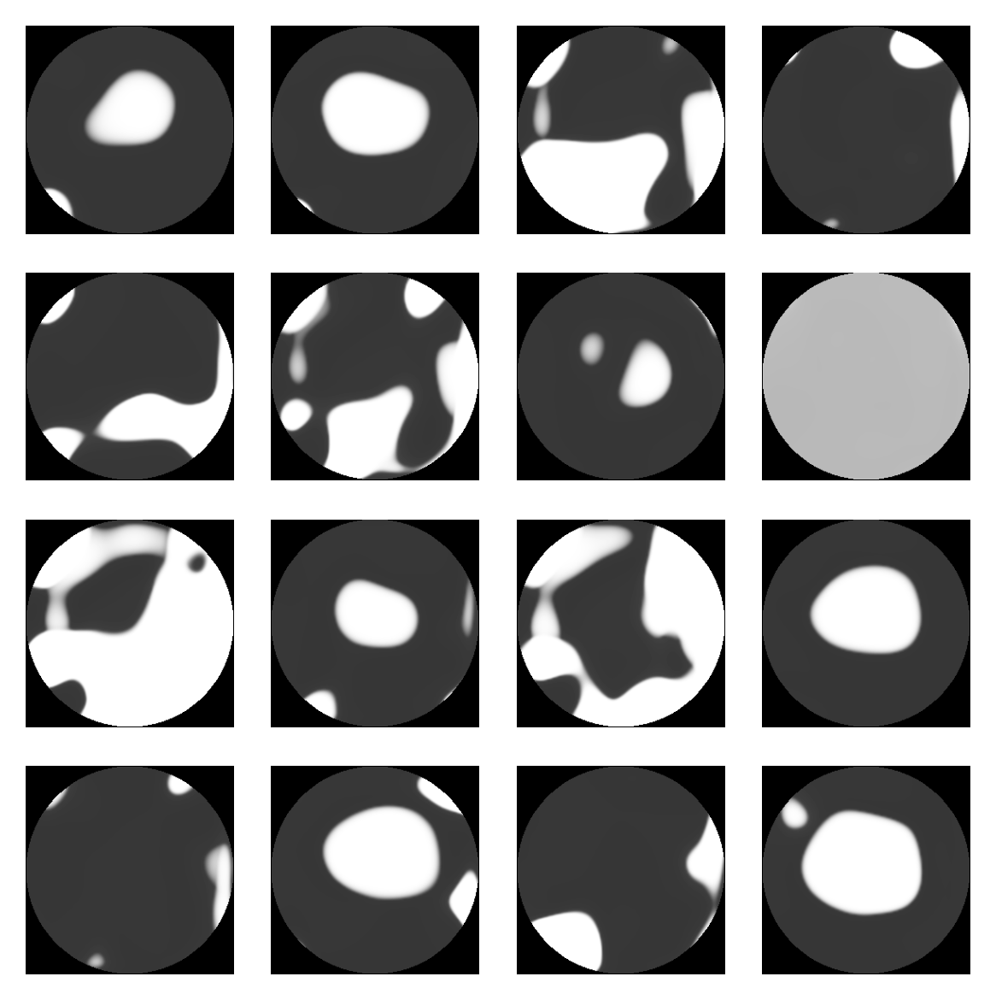

In [29]:
f = plt.figure(figsize=(4,4), dpi=300)

for i,idx in enumerate(indices):
    p = plt.subplot(4,4,i+1)
    plt.imshow(fake_batch[idx,1,...], cmap='gray')
    plt.axis('off')
    
plt.tight_layout()

### Использование обученного генератора $\mathcal{G}(\mathbb{\cdot})$

In [ ]:
def SamplingUnitSphereUniform(ndim=2, nsamples=100):
    samples =  torch.tensor(np.random.normal(0, 1, (nsamples, ndim)), dtype=torch.float)
    for i in range(nsamples) :
        norm = torch.dot(samples[i], samples[i]) ** (0.5)
        samples[i] /= norm
    return samples

In [ ]:
def SamplingBallUniform(ndim=2, radius=1, nsamples=100):
    ball = SamplingUnitSphereUniform(ndim, nsamples)
    uniform_distr = np.random.uniform(0, 1, size = (nsamples))
    for i in range(nsamples) :
        ball[i] *= radius * (uniform_distr[i] ** (1.0 / ndim))
    return ball

In [ ]:
def SampleInnerAndOuterExamples(ndim=2, radius_inner=1, radius_outer=2, nsamples=100):
    samples_inner_np = []
    samples_outer_np = []
    ball = SamplingBallUniform(ndim, radius_outer, nsamples).numpy()
    for i in range(nsamples) :
        radius = np.dot(ball[i], ball[i]) ** (0.5)
        if radius > radius_inner :
            samples_outer_np.append(ball[i])
        else :
            samples_inner_np.append(ball[i])
    samples_inner = torch.tensor(samples_inner_np)
    samples_outer = torch.tensor(samples_outer_np)
    return samples_inner, samples_outer

### Проверьте свою реализацию сэмплирования

В качестве проверки можно породить, скажем, 10000 примеров, равномерно распределенных в двумерном шаре (на круге, $n=2$). Внешний радиус нужно поставить в значение $R_{outer}=q_{0.98}(|z|_2, n)*2^{1/n}$, внутренний - в значение $R_{inner}=q_{0.98}(|z|_2, n)$

Ожидаемый результат:
- примеров `examples_inner` и `examples_outer` должно получиться примерно одинаковое количество;
- примеры распределены равномерно по кругу радиусом примерно 4;
- "обычные" (внутри круга радиусом $R_{inner}$) и "аномальные" (в кольце между окружностями радиусом $R_{inner}$ и $R_{outer}$) примеры визуально не перемешиваются;

In [ ]:
examples_inner, examples_outer = SampleInnerAndOuterExamples(ndim=2,
                                                             radius_inner=stats.chi.ppf(0.98, 2),
                                                             radius_outer=stats.chi.ppf(0.98, 2)*np.sqrt(2),
                                                             nsamples=10000)
examples_inner.shape[0], examples_outer.shape[0]

(5020, 4980)

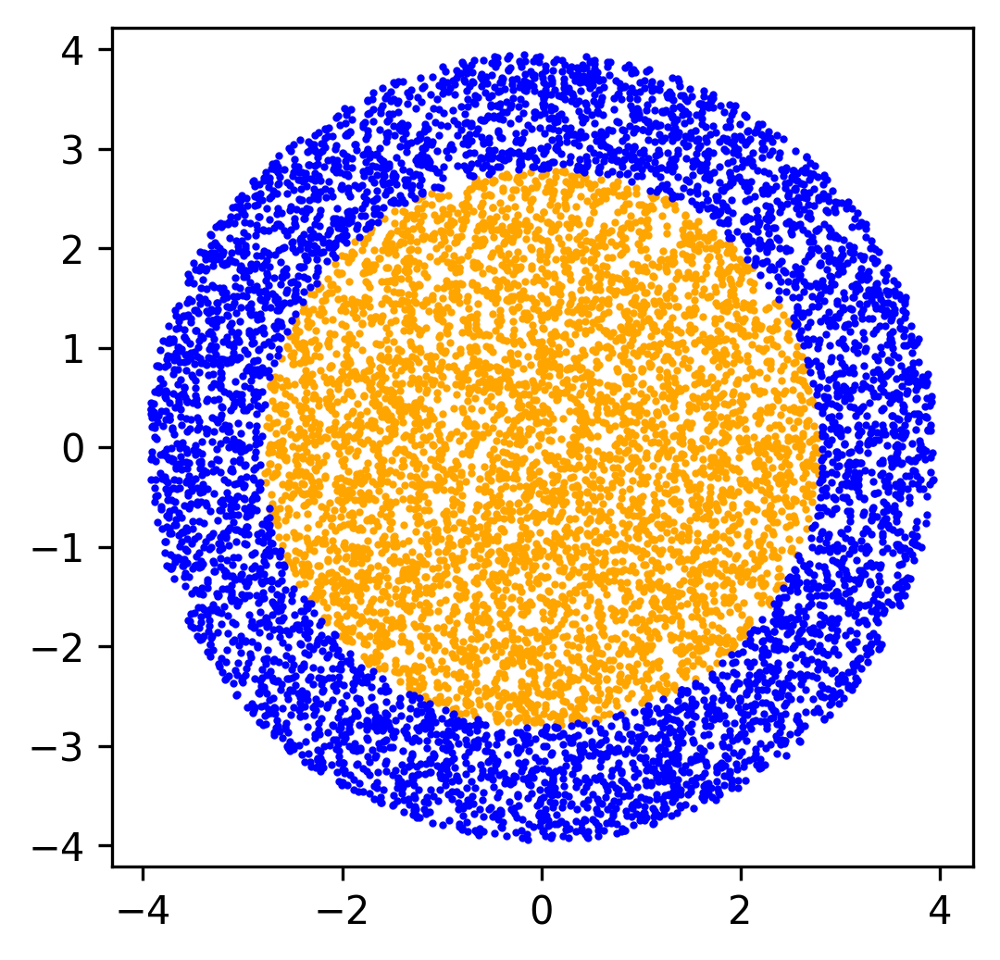

In [ ]:
f = plt.figure(figsize=(4,4), dpi=300)
plt.scatter(examples_inner[:,0], examples_inner[:,1], s=1, color='orange')
plt.scatter(examples_outer[:,0], examples_outer[:,1], s=1, color='blue')
_ = plt.axis('equal')

### Еще одна проверка реализации сэмплирования
Результат: примеров получилось примерно одинаковое количество

In [ ]:
chi_p98 = stats.chi.ppf(0.98, 2) # значение перцентиля уровня 98% распределения хи с количеством степеней свободы latent_dim
print(chi_p98)

2.797149622536537


In [ ]:
examples_inner, examples_outer = SampleInnerAndOuterExamples(ndim=latent_dim,
                                                             radius_inner=chi_p98,
                                                             radius_outer=chi_p98*np.power(2, 1/latent_dim),
                                                             nsamples=10000)
print(examples_inner.shape[0], examples_outer.shape[0])

4972 5028


## Обучение классификатора $\mathcal{F}(\mathbf{\cdot})$

In [ ]:
# При необходимости можно загрузить нужное состояние генератора
gen = Generator(n_inputs=latent_dim)
#gen.load_state_dict(torch.load('./path/to/model/checkpoint/gen.pt'))
gen = gen.to(DEVICE)

In [ ]:
class Classifier(nn.Module):
    
    def __init__(self):
        super(Classifier, self).__init__()
        
        self.CNN = nn.ModuleList([
            nn.Conv2d(in_channels=2, out_channels=8, kernel_size=3, padding=1, stride=2, bias=False),
            nn.BatchNorm2d(num_features=8),
            nn.ReLU(),
            nn.Conv2d(in_channels=8, out_channels=32, kernel_size=3, padding=1, stride=2, bias=False),
            nn.BatchNorm2d(num_features=32),
            nn.ReLU(),
            nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, padding=1, stride=2, bias=False),
            nn.BatchNorm2d(num_features=64),
            nn.ReLU(),
            nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, padding=1, stride=2, bias=False),
            nn.BatchNorm2d(num_features=128),
            nn.ReLU(),
            nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, padding=1, stride=2, bias=False),
            nn.BatchNorm2d(num_features=256),
            nn.ReLU()
        ])

        self.size = 256 * 8 * 8

        self.regressor = nn.ModuleList([
            nn.Linear(self.size, 2048),
            nn.LeakyReLU(),
            nn.Linear(2048, 512),
            nn.LeakyReLU(),
            nn.Linear(256, 32),
            nn.LeakyReLU(),
            nn.Linear(32, 2),
            nn.Softmax(dim=1)
        ])

    def forward(self, x):
        
        for _,f in enumerate(self.CNN) :
          x = f(x)

        x = torch.flatten(x, start_dim=1)
        
        for _, f in enumerate(self.regressor) :
            x = f(x) 
  
        return x

In [ ]:
clf = Classifier()
clf = clf.to(DEVICE)

In [ ]:
def train_classifier(model_gen: torch.nn.Module, 
                     model_clf: torch.nn.Module,
                     batch_size = 64,
                     batches_per_epoch = 128,
                     max_epochs = 512):
    
    optimizer = torch.optim.Adam(model_clf.parameters(), lr=1e-4)
    loss_fn = nn.CrossEntropyLoss()
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer)
    
    val_loss_history = []
    model_gen.eval()
    
    for epoch in range(max_epochs):
        print(f'Starting epoch {epoch+1} of {max_epochs}')
        for _ in range(batches_per_epoch) :
            model_clf.train()
        
            optimizer.zero_grad()
            noise_inner, noise_outer = SampleInnerAndOuterExamples(ndim=latent_dim,
                                                             radius_inner=stats.chi.ppf(0.98, 2),
                                                             radius_outer=stats.chi.ppf(0.98, 2)*np.sqrt(2),
                                                             nsamples=batch_size)
            batch_inner = model_gen(noise_inner)
            batch_outer = model_gen(noise_outer)
            batch_inner = apply_mask(batch_inner)
            batch_outer = apply_mask(batch_outer)
            batch_inner.to(DEVICE)
            batch_outer.to(DEVICE)

            inner_prediction = model_clf(batch_inner)
            outer_prediction = model_clf(batch_outer)

            target_inner = torch.zeros((batch_inner.shape[0]), device=DEVICE)
            target_outer = torch.ones((batch_outer.shape[0]), device=DEVICE)
            loss = loss_fn(inner_prediction, target_inner) + loss_fn(outer_prediction, target_outer)
            loss.backward()
            optimizer.step()
     
        model_clf.eval()
        val_loss_epoch = loss #change it
            
        val_loss_history.append(val_loss_epoch)
        print('Eval loss on epoch %d: %f' % (epoch+1, loss_epoch))
        
        scheduler.step()
        
    return val_loss_history

In [ ]:
val_loss_history = train_classifier(model_gen=gen,
                                    model_clf=clf,
                                    batch_size = 128,
                                    batches_per_epoch = 128,
                                    max_epochs = 512)

## Применение классификатора $\mathcal{F}(\mathbf{\cdot})$

In [ ]:
ds_test = DS('/content/pv_data_projected_all.normed01.npy',
             '/content/gh_data_projected_all.normed01.npy',
             '/content/mask_256.npy',
             train_transforms)

In [ ]:
test_loader = torch.utils.data.DataLoader(ds_test, shuffle=False, batch_size=1)

In [ ]:
clf = Classifier()
clf.load_state_dict(torch.load('/path/to/classifier/checkpoint/file.pt'))
clf = clf.to(DEVICE)

In [ ]:
idx = 0
idx_anomalies = []
probabilities = []
for sample in test_loader:
    score = clf(sample)
    if score[1] > score[0] :
        idx_anomalies.append(idx)
    probabilities.append(score[1])
    idx += 1

In [ ]:
indices = np.random.randint(0, len(idx_anomalies), size=5)

samples = [ds_test[idx] for idx in indices]
fig = plt.figure(figsize=(2, 5), dpi=300)
for idx,sample in enumerate(samples):
    sample_np = sample.squeeze(0).numpy()
    p = plt.subplot(8,2,idx*2+1)
    plt.imshow(sample_np[0], cmap='gray')
    plt.axis('off')
    
    p = plt.subplot(8,2,idx*2+2)
    plt.imshow(sample_np[1], cmap='gray')
    plt.axis('off')

## Анализ результатов.

In [ ]:
import seaborn as sns
fig, ax = plt.subplots(figsize=(30,10))
sns.histplot(probabilities)
ax.set_title('Anomaly probability', fontsize = 30)
ax.set_xlabel('Probabililty', fontsize = 30)
ax.set_ylabel('Count', fontsize = 30)
ax.set_xticks(np.arange(0, 120, step = 5))
plt.tight_layout()

In [ ]:
threshold = None

In [ ]:
anomalies = []
for i, loss in enumerate(probabilites) :
    if probability > threshold : 
        anomalies.append((i, probability))
print(f'Count of anomalies: {len(anomalies)}\nLength of test dataset: {len(losses)}')

In [ ]:
indices = np.random.randint(0, len(anomalies), size=5)

fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(10, 5), dpi=200)
for i in range(5) :
    sample_index = anomalies[indices[i]][0]
    probability = anomalies[indices[i]][1]
    sample = ds_test[sample_index]
    sample = sample.unsqueeze_(0)
    axes[0][i].imshow(np.squeeze(sample), cmap='gray')
    axes[0][i].set_xticks([])
    axes[0][i].set_yticks([])